In [53]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sys import platform

sns.set_context("notebook", font_scale=10, rc={"lines.linewidth": 10, "lines.markersize": 30})


In [54]:
if platform == 'linux':
    home = '/home/krista/'
elif platform == 'darwin': 
    home = '/Users/67981492/'

In [55]:
learning_signals = pd.read_csv(home+'Dropbox/volatileValues/simple_rt_experiment_probabilityC/analysis/aggregated_data/probC_sim_learning_signals.csv')
obs_df = pd.read_csv(home+'Dropbox/volatileValues/simple_rt_experiment_probabilityC/analysis/aggregated_data/clean_df.csv')
# exp_param_df = pd.read_csv(home+'Dropbox/volatileValues/simple_rt_experiment_probabilityC/analysis/aggregated_data/exp_param_df.csv')


In [4]:
write_dir=home+'Dropbox/volatileValues/simple_rt_experiment_probabilityC/analysis/aggregated_data/'

In [57]:
learning_signals.columns = learning_signals.columns.str.strip()
obs_df.columns = obs_df.columns.str.strip()
# exp_param_df.columns = exp_param_df.columns.str.strip()

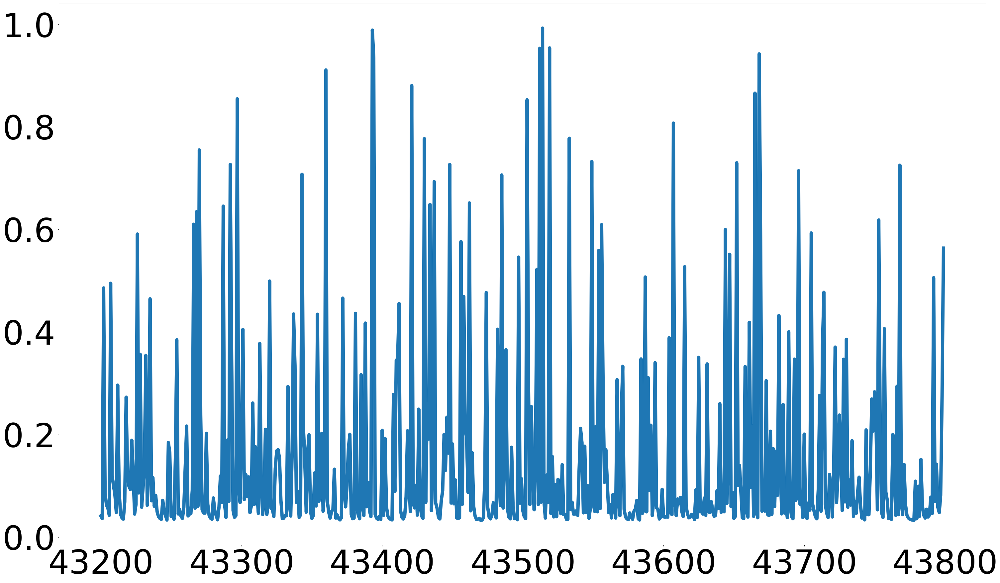

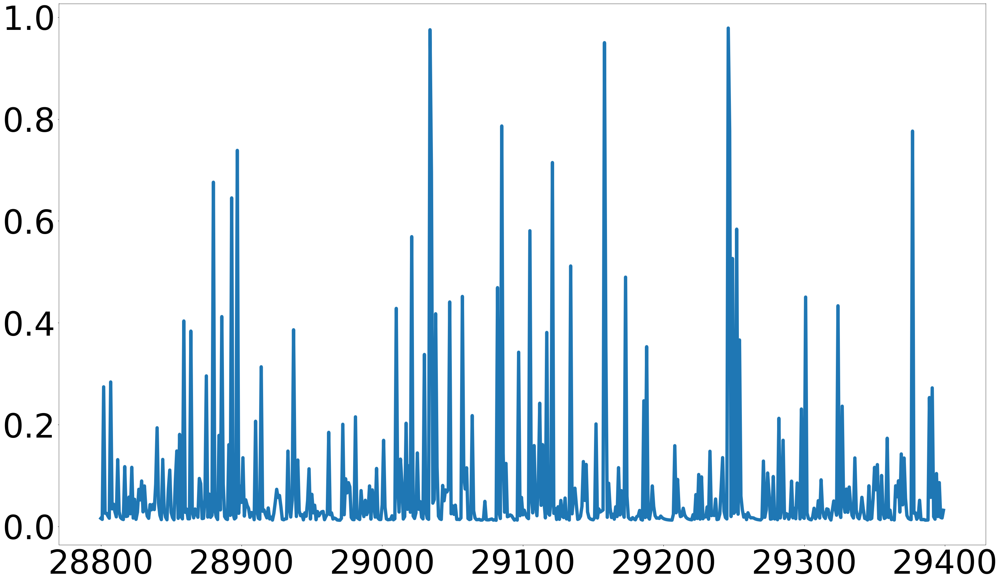

In [63]:
plt.figure(figsize=(50,30))
plt.plot(learning_signals.cpp[learning_signals.cond == 'hv'][0:600])
plt.show()
plt.figure(figsize=(50,30))
plt.plot(learning_signals.cpp[learning_signals.cond == 'lv'][0:600])


In [6]:
learning_signals_sorted = learning_signals.sort_values(['ID', 'cond'], axis=0, ascending=True)
obs_df_sorted = obs_df.sort_values(['ID', 'condition'], axis=0, ascending=True)
# exp_param_df_sorted = exp_param_df.sort_values(['ID', 'condition'], axis=0, ascending=True)


learning_signals_sorted = learning_signals_sorted.reset_index(drop=True);
obs_df_sorted = obs_df_sorted.reset_index(drop=True);
# exp_param_df_sorted = exp_param_df_sorted.reset_index(drop=True);

In [47]:
plt.figure(figsize=(50,30))
posterror_index = obs_df_sorted.rt[(obs_df_sorted.p_id_accuracy == 0)].index + 1
posterror_rts = obs_df_sorted.loc[posterror_index, 'rt']
postcorrect_index = obs_df_sorted.rt[(obs_df_sorted.p_id_accuracy == 1)].index + 1
postcorrect_rts= obs_df_sorted.loc[postcorrect_index, 'rt']

/home/krista/anaconda3/envs/hddm/lib/python3.5/site-packages/pandas/core/indexing.py:1027: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


<Figure size 3600x2160 with 0 Axes>

In [52]:
np.mean(posterror_rts), np.mean(postcorrect_rts), np.std(posterror_rts), np.std(postcorrect_rts)

(0.3349189276930209,
 0.32818416831254621,
 0.11612632894944043,
 0.10211405201823034)

In [17]:
print(np.unique(learning_signals_sorted.cond), np.unique(obs_df_sorted.condition))
print(np.unique(learning_signals_sorted.ID), np.unique(obs_df_sorted.ID))

['hc' 'hv' 'lc' 'lv'] ['hc' 'hv' 'lc' 'lv']
[761 762 763 764 765 766 767 768 769 770 771 772 773 774 775 776 777 778
 779 780 781 782 783 784] [761 762 763 764 765 766 767 768 769 770 771 772 773 774 775 776 777 778
 779 780 781 782 783 784]


In [18]:
n_cond = len(np.unique(learning_signals_sorted.cond))
n_participants = len(np.unique(learning_signals.ID))
n_clean_trials = len(learning_signals_sorted) / (n_cond*n_participants)

print(n_cond, n_participants, n_clean_trials)

4 24 600.0


In [19]:
#verify same reward structure in simulated & observed data  
#obs_cps should be the same on each row. 
sum(learning_signals_sorted.obs_cp == obs_df_sorted.obs_cp_with_slow_fast) == len(obs_df_sorted)

ValueError: Can only compare identically-labeled Series objects

In [20]:
learning_signals_sorted.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'rt',
       'acc', 'subj_idx', 'ID', 'cond', 'id_choices', 'correct_id_choices',
       'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp'],
      dtype='object')

,cpp,target_B,choice_B,cp,gen_drift,gen_bound,rt,acc,subj_idx,ID,cond,id_choices,correct_id_choices,b_t0,b_t1,r_t1,r_t2,obs_cp,trial
0,0.099471,0.000000,0.000000,0,0.013572,0.416406,0.700,False,0,761,hc,0,1,0.000000,0.000000,2.528877,0.000000,0,1
1,0.035079,0.000000,0.000000,0,0.013572,0.599471,0.700,False,0,761,hc,0,1,1.390214,0.149207,0.000000,3.978021,1,2
2,0.023075,-1.241007,1.241007,0,0.013572,0.535079,0.700,False,0,761,hc,0,1,0.792372,0.196591,0.000000,2.754457,0,3
3,0.019881,-0.595781,0.595781,0,-1.000000,0.523075,0.172,False,0,761,hc,0,1,0.532802,0.226667,0.000000,3.330826,0,4
4,0.018539,-0.306135,0.306135,0,-1.000000,0.519881,0.172,False,0,761,hc,0,1,0.391376,0.251982,0.000000,2.527291,0,5


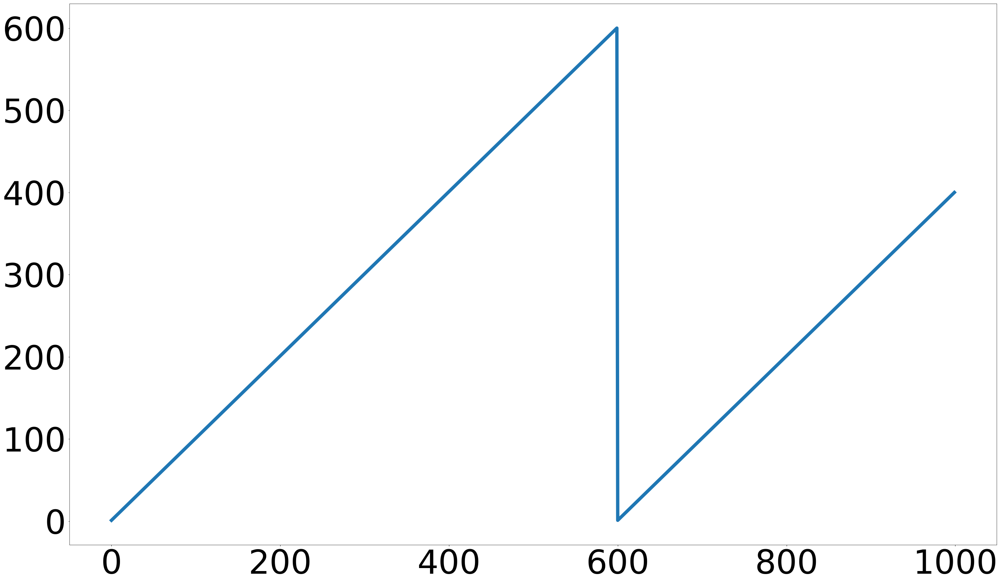

In [21]:
learning_signals_sorted['trial'] = np.tile(range(1,601), n_participants*n_cond)

plt.figure(figsize=(50,30))
plt.plot(learning_signals_sorted.trial[0:1000])
learning_signals_sorted.head()

In [22]:
#zero or one based indexing for trials? 
print(obs_df_sorted.repeat_trial.values.min())
#check indexing for learning_signals trials, should be same as above 
print(learning_signals_sorted.trial.min())
#should be empty df 
print(obs_df_sorted[obs_df_sorted.rt > 1] | obs_df_sorted[obs_df_sorted.rt < .1])

1
1
Empty DataFrame
Columns: [LR_choice, obs_LR_accuracy, obs_LR_solution, reward, cumulative_reward, rt, total_trial_time, iti, cp_with_slow_fast, obs_cp_with_slow_fast, obs_high_val_cue, ID, condition, coded_condition, original_trial, epoch_n, epoch_trial, shifted_epoch_trial, max_epoch_n, repeat_trial, prop_112, n_epoch_trials, p_id_solution, obs_low_val_cue, id_choice, p_id_accuracy]
Index: []

[0 rows x 26 columns]


In [14]:
test_cp = learning_signals_sorted.cp == obs_df_sorted.cp_with_slow_fast
false_idx = np.where(test_cp == 0)
print(false_idx)

(array([    0,   600,  1200,  1800,  3000,  3600,  4200,  4800,  6000,
        6600,  7200,  8400,  9600, 10200, 10800, 11400, 12000, 12600,
       13800, 15000, 15600, 16800, 17400, 18000, 19200, 20400, 21000,
       21600, 22200, 22800, 23400, 25200, 25800, 26400, 27000, 28800,
       29400, 30000, 30600, 31200, 32400, 33000, 34200, 34800, 36000,
       36600, 37800, 38400, 39000, 39600, 40200, 40800, 42600, 43800,
       44400, 45000, 45600, 46200, 46800, 48000, 48600, 49800, 50400,
       51600, 52800, 54600, 55200, 55800, 56400, 57000]),)


In [15]:
#ls cp idx is marked as 0 when obs_cp idx is marked as 1 
print('ls_cp_false_idx ', learning_signals_sorted.cp.values[false_idx], 'obs_cp_false_idx ', obs_df_sorted.cp_with_slow_fast.values[false_idx])

ls_cp_false_idx  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] obs_cp_false_idx  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [16]:
#trials where there is a difference 
print('ls_cp_false_trial ', learning_signals_sorted.trial.values[false_idx], 'obs_cp_false_trial ', obs_df_sorted.repeat_trial.values[false_idx])

ls_cp_false_trial  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1] obs_cp_false_trial  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [17]:
#when the trial number is 1, cp is not marked in the ls dataframe
#fix --make sure trial 1 is marked as a cp for both dataframes
learning_signals_sorted.loc[learning_signals_sorted.trial == 1, 'cp'] = 1
obs_df_sorted.loc[obs_df_sorted.repeat_trial == 1, 'cp_with_slow_fast'] = 1

#these should now all be ones
# print(learning_signals_sorted.cp[learning_signals_sorted.trial == 1], obs_df_sorted.cp_with_slow_fast[obs_df_sorted.repeat_trial == 1])

# #retest cp 
retest_cp = learning_signals_sorted.cp == obs_df_sorted.cp_with_slow_fast
retest_false_idx = np.where(retest_cp == 0)

print(retest_false_idx)

(array([], dtype=int64),)


In [18]:
obs_df_sorted.head()

,LR_choice,obs_LR_accuracy,obs_LR_solution,reward,cumulative_reward,rt,total_trial_time,iti,cp_with_slow_fast,obs_cp_with_slow_fast,...,epoch_trial_zero_idx,epoch_trial_one_idx,shifted_epoch_trial_zero_idx,repeat_trial,prop_112,n_epoch_trials,p_id_solution,obs_low_val_cue,id_choice,p_id_accuracy
0,1,0,0,0,599,0.711570,2.385458,0.670199,1,0,...,0,1,0,1,0.305556,36,111,111,111,1
1,1,0,0,0,598,0.681410,1.939019,0.259707,0,1,...,1,2,1,2,0.305556,36,111,112,112,0
2,0,1,0,2,599,0.767118,2.498060,0.740615,0,0,...,2,3,2,3,0.305556,36,111,112,111,1
3,1,0,0,0,598,0.507209,1.742433,0.250242,0,0,...,3,4,3,4,0.305556,36,111,112,112,0
4,1,1,1,2,599,0.656259,2.350417,0.700190,0,0,...,4,5,4,5,0.305556,36,111,112,111,1


In [19]:
learning_signals_sorted.head()

,cpp,target_B,choice_B,cp,gen_drift,gen_bound,rt,acc,subj_idx,ID,cond,id_choices,correct_id_choices,b_t0,b_t1,r_t1,r_t2,obs_cp,trial
0,0.099471,0.000000,0.000000,1,0.013572,0.416406,0.700,False,0,761,hc,0,1,0.000000,0.000000,2.528877,0.000000,0,1
1,0.035079,0.000000,0.000000,0,0.013572,0.599471,0.700,False,0,761,hc,0,1,1.390214,0.149207,0.000000,3.978021,1,2
2,0.023075,-1.241007,1.241007,0,0.013572,0.535079,0.700,False,0,761,hc,0,1,0.792372,0.196591,0.000000,2.754457,0,3
3,0.019881,-0.595781,0.595781,0,-1.000000,0.523075,0.172,False,0,761,hc,0,1,0.532802,0.226667,0.000000,3.330826,0,4
4,0.018539,-0.306135,0.306135,0,-1.000000,0.519881,0.172,False,0,761,hc,0,1,0.391376,0.251982,0.000000,2.527291,0,5


In [20]:
#check that subject ID vectors & conditions are the same for the ls and observed dataframe
#on row-wise basis
print('ID vectors are the same: ', sum(obs_df_sorted.ID.values ==  learning_signals_sorted.ID.values) == len(obs_df_sorted))

print('condition vectors are the same: ', sum(obs_df_sorted.condition.values ==  learning_signals_sorted.cond.values) == len(obs_df_sorted))

ID vectors are the same:  True
condition vectors are the same:  True


In [21]:
# #check that solutions are the same 
# obs_df_sorted.p_id_solution.values[0:20], learning_signals_sorted.p_id_solution.values[0:20]

# print('p_id_solution vectors are the same: ', sum(obs_df_sorted.p_id_solution.values ==  learning_signals_sorted.p_id_solution.values) == len(obs_df_sorted))

# test_soln = obs_df_sorted.p_id_solution.values ==  learning_signals_sorted.p_id_solution.values
# test_soln_false_idx = np.where(test_soln == 0 )

# print(test_soln_false_idx)

In [22]:
# print('ls_ID_false_trial ', learning_signals_sorted.trial.values[test_soln_false_idx], 'obs_ID_false_trial ', obs_df_sorted.repeat_trial.values[test_soln_false_idx])

# plt.figure(figsize=(50,30))
# plt.hist(learning_signals_sorted.trial.values[test_soln_false_idx])
# plt.hist(obs_df_sorted.repeat_trial.values[test_soln_false_idx], alpha=0.3)

In [23]:
#calculate ideal - nonideal for B 
learning_signals_sorted.columns, learning_signals.shape, obs_df.shape

(Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'rt',
        'acc', 'subj_idx', 'ID', 'cond', 'id_choices', 'correct_id_choices',
        'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp', 'trial'],
       dtype='object'), (57600, 18), (57600, 29))

In [24]:
#check values 
#recalculate accuracy to check for contradictions
test_acc = learning_signals_sorted.id_choices == learning_signals_sorted.correct_id_choices
sum(test_acc == learning_signals_sorted.acc) == len(test_acc)

True

In [25]:
#create an array of the beliefs for the two targets
B_targets = np.column_stack((learning_signals_sorted.b_t0, learning_signals_sorted.b_t1))
#for each trial, get col 0 if 0 is correct, 1 if 1 is correct
np.shape(B_targets)

(57600, 2)

In [26]:
#get the belief for the ideal target
B_ideal_target = np.asarray([B_targets[t, learning_signals_sorted.correct_id_choices[t]] for t in range(0,len(learning_signals_sorted))])
B_nonideal_target = np.asarray([B_targets[t, (1-learning_signals_sorted.correct_id_choices[t])] for t in range(0,len(learning_signals_sorted))])

learning_signals_sorted['ideal_B'] = B_ideal_target - B_nonideal_target
learning_signals_sorted['B_ideal_target'] = B_ideal_target
learning_signals_sorted['B_nonideal_target'] = B_nonideal_target

In [27]:
#check for nans
sum(np.isnan(learning_signals_sorted.ideal_B))

0

In [37]:
#get samples for checking 
sim_sample = learning_signals_sorted[(learning_signals_sorted.ID == 761) & (learning_signals_sorted.cond == 'lc')]
obs_sample = obs_df_sorted[(obs_df_sorted.ID == 761) & (obs_df_sorted.condition == 'lc')]

sim_sample_2 = learning_signals_sorted[(learning_signals_sorted.ID == 774) & (learning_signals_sorted.cond == 'lc')]
obs_sample_2 = obs_df_sorted[(obs_df_sorted.ID == 774) & (obs_df_sorted.condition == 'lc')]

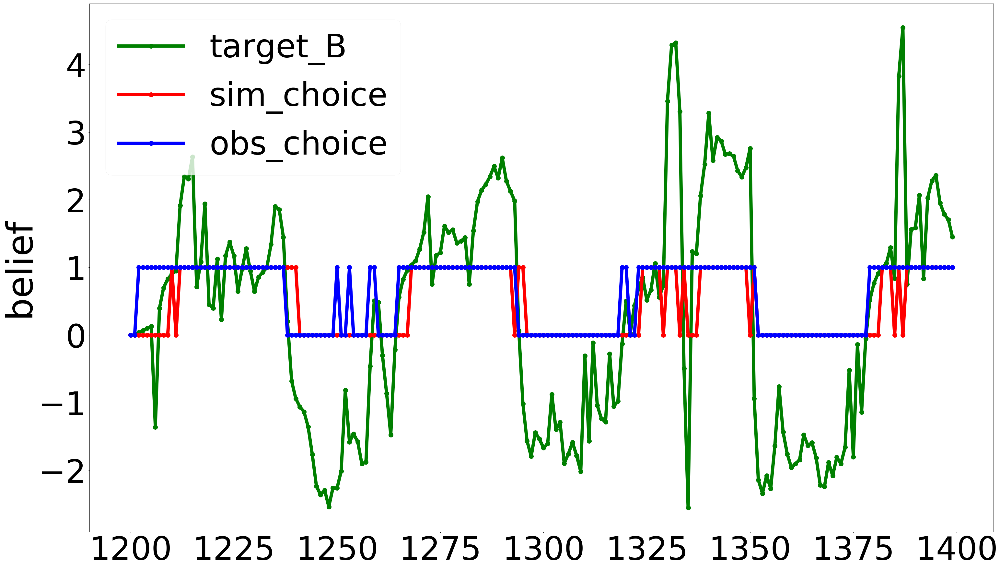

In [29]:
#make sure that the choice faces the same direction as the signed belief estimate 
#for simulated and real data 
plt.figure(figsize=(50,30))
plt.plot(learning_signals_sorted.target_B[1200:1400], 'g.-', label='target_B')
plt.plot(learning_signals_sorted.id_choices[1200:1400], 'r.-', label='sim_choice')

#need to subtract 111 to get 0/1 identity instead of ascii value 
plt.plot(obs_df_sorted.id_choice[1200:1400] - 111, 'b.-', label='obs_choice')

plt.ylabel('belief')
plt.legend()

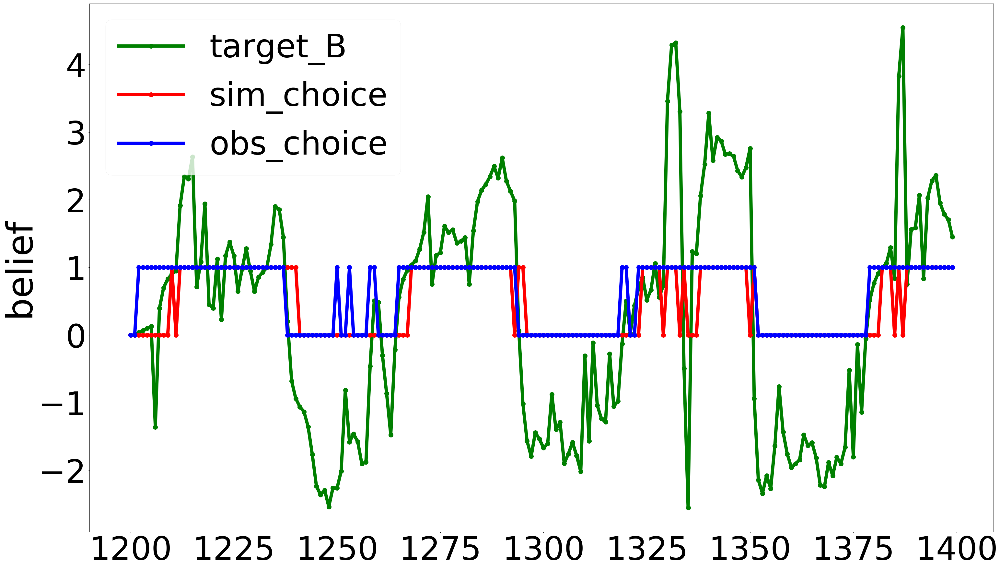

In [30]:
#make sure that the choice faces the same direction as the signed belief estimate 
#for simulated and real data 
plt.figure(figsize=(50,30))
plt.plot(sim_sample.target_B[0:200], 'g.-', label='target_B')
plt.plot(sim_sample.id_choices[0:200], 'r.-', label='sim_choice')

#need to subtract 111 to get 0/1 identity instead of ascii value 
plt.plot(obs_sample.id_choice[0:200] - 111, 'b.-', label='obs_choice')

plt.ylabel('belief')
plt.legend()

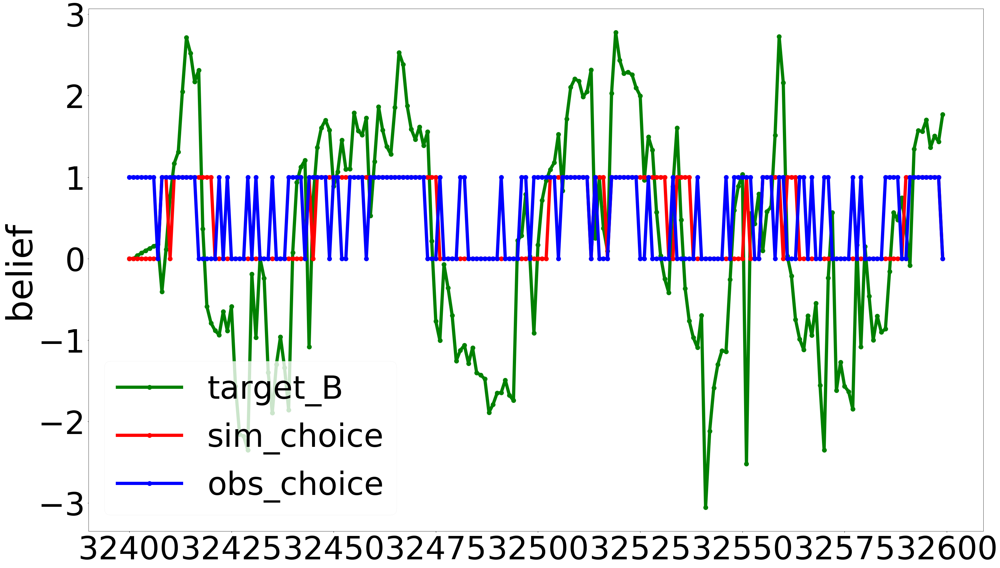

In [31]:
#another sample, poorer task performance
plt.figure(figsize=(50,30))
plt.plot(sim_sample_2.target_B[0:200], 'g.-', label='target_B')
plt.plot(sim_sample_2.id_choices[0:200], 'r.-', label='sim_choice')

#need to subtract 111 to get 0/1 identity instead of ascii value 
plt.plot(obs_sample_2.id_choice[0:200] - 111, 'b.-', label='obs_choice')

plt.ylabel('belief')
plt.legend()

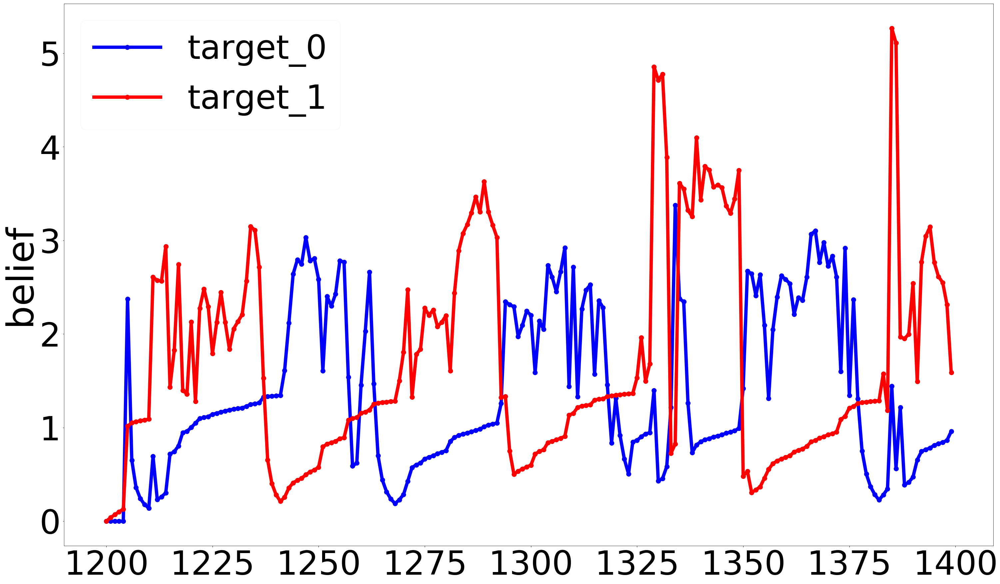

In [32]:
plt.figure(figsize=(50,30))
plt.plot(sim_sample.b_t0[0:200], 'b.-', label='target_0')
plt.plot(sim_sample.b_t1[0:200], 'r.-', label='target_1')
plt.ylabel('belief')
plt.legend()

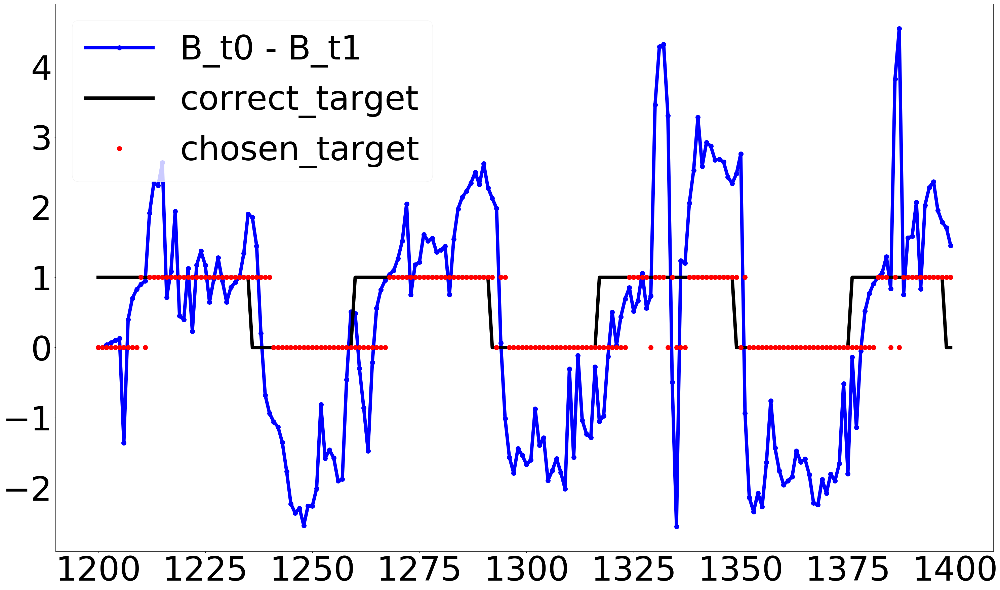

In [33]:
plt.figure(figsize=(50,30))
#should see correspondence of sign of target-belief & id choice 
plt.plot(sim_sample.target_B[0:200], 'b.-', label='B_t0 - B_t1')
plt.plot(sim_sample.correct_id_choices[0:200], 'k-', label='correct_target')
plt.plot(sim_sample.id_choices[0:200], 'r.', label='chosen_target')
plt.legend()

Text(0,0.5,'$B_{ideal} - B_{nonideal}$')

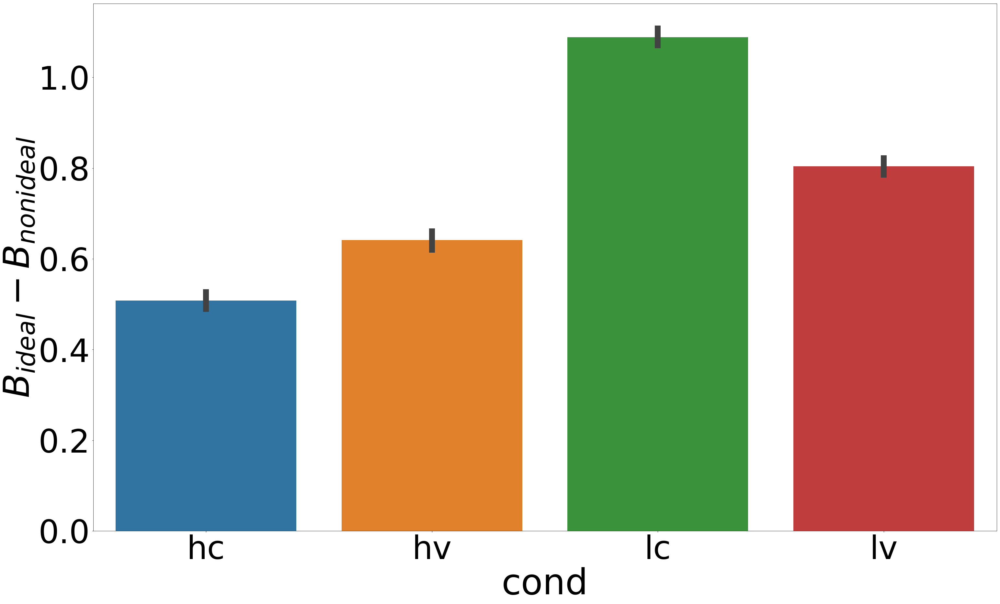

In [34]:
#b_ideal
#interaction effect 
plt.figure(figsize=(50,30))
sns.barplot(x="cond",y="ideal_B", data=learning_signals_sorted, ci=95, n_boot=1000)
plt.ylabel('$B_{ideal} - B_{nonideal}$')

In [66]:
learning_signals_sorted.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'rt',
       'acc', 'subj_idx', 'ID', 'cond', 'id_choices', 'correct_id_choices',
       'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp', 'trial'],
      dtype='object')

Text(0,0.5,'decision threshold, $a$')

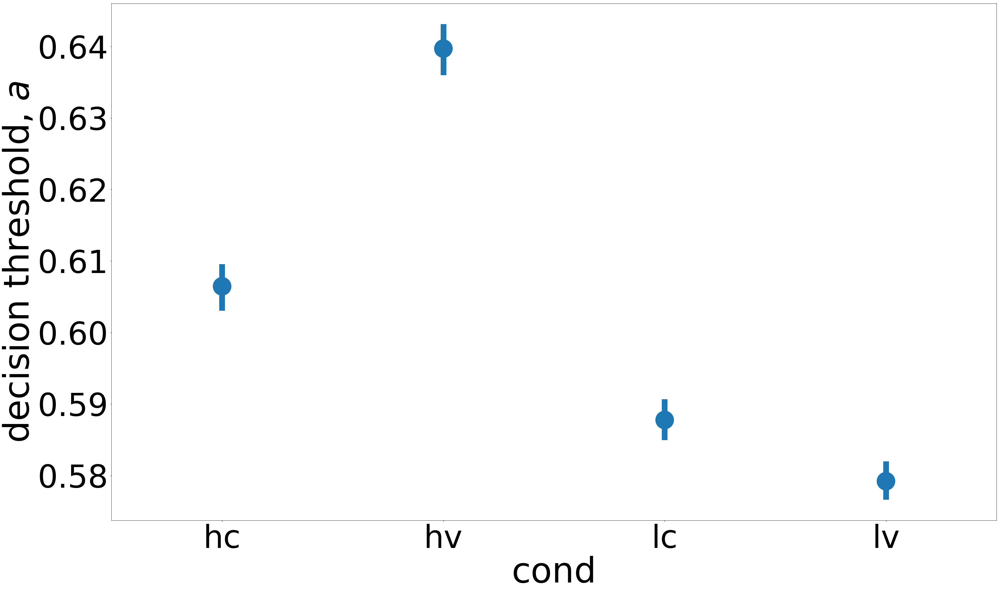

In [70]:
plt.figure(figsize=(50,30))
sns.pointplot(x="cond",y="gen_bound", data=learning_signals_sorted, ci=95, n_boot=1000, join=False)
plt.ylabel('decision threshold, $a$')

Text(0,0.5,'drift-rate, $v$')

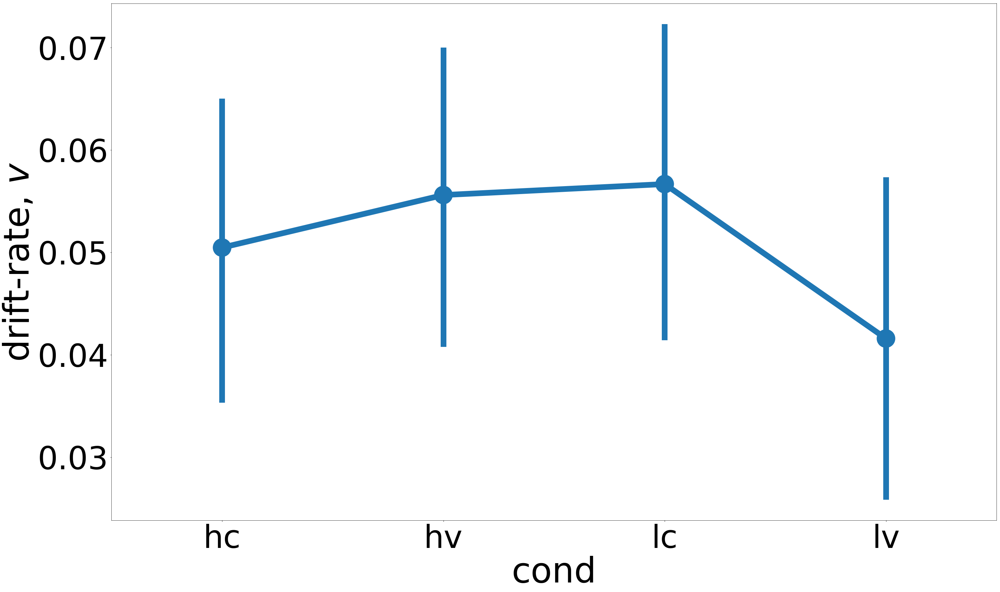

In [69]:
plt.figure(figsize=(50,30))
sns.pointplot(x="cond",y="gen_drift", data=learning_signals_sorted, ci=95, n_boot=1000, join = False)
plt.ylabel('drift-rate, $v$')

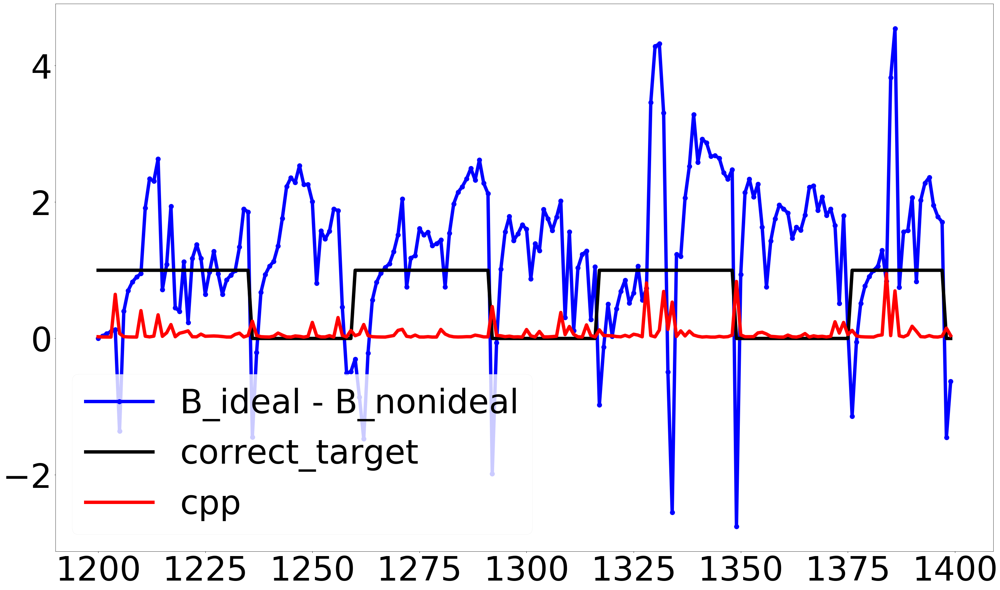

In [35]:
plt.figure(figsize=(50,30))
plt.plot(sim_sample.ideal_B[0:200], 'b.-', label='B_ideal - B_nonideal')
plt.plot(sim_sample.correct_id_choices[0:200], 'k-', label='correct_target')
plt.plot(sim_sample.cpp[0:200], 'r-', label='cpp')
plt.legend()

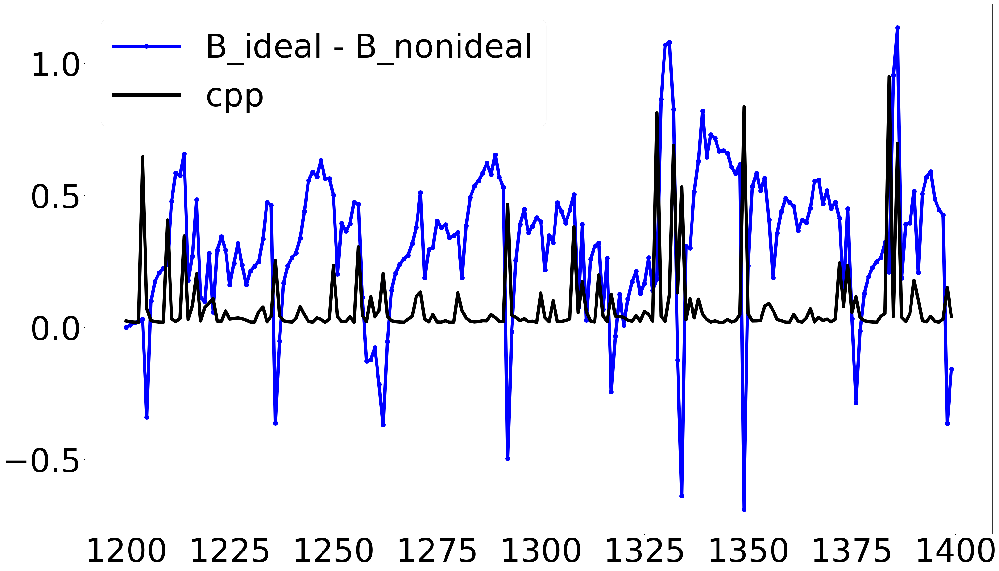

In [37]:
plt.figure(figsize=(50,30))
plt.plot(sim_sample.ideal_B[0:200]/4, 'b.-', label='B_ideal - B_nonideal')
plt.plot(sim_sample.cpp[0:200], 'k-', label='cpp')
plt.legend()

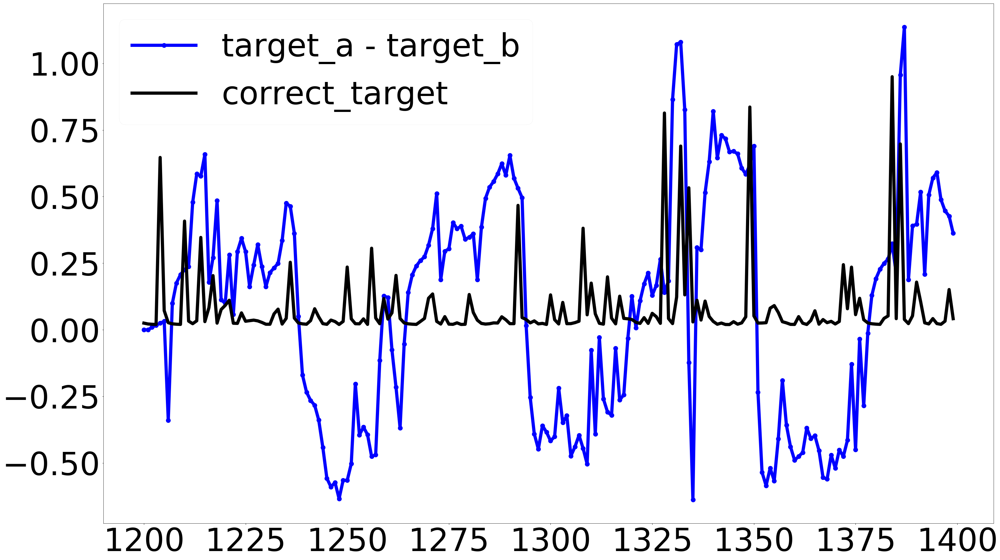

In [38]:
plt.figure(figsize=(50,30))
plt.plot(sim_sample.target_B[0:200]/4, 'b.-', label='target_a - target_b')
plt.plot(sim_sample.cpp[0:200], 'k-', label='correct_target')
plt.legend()

Text(0,0.5,'$B_{choice} - B_{nonchoice}$')

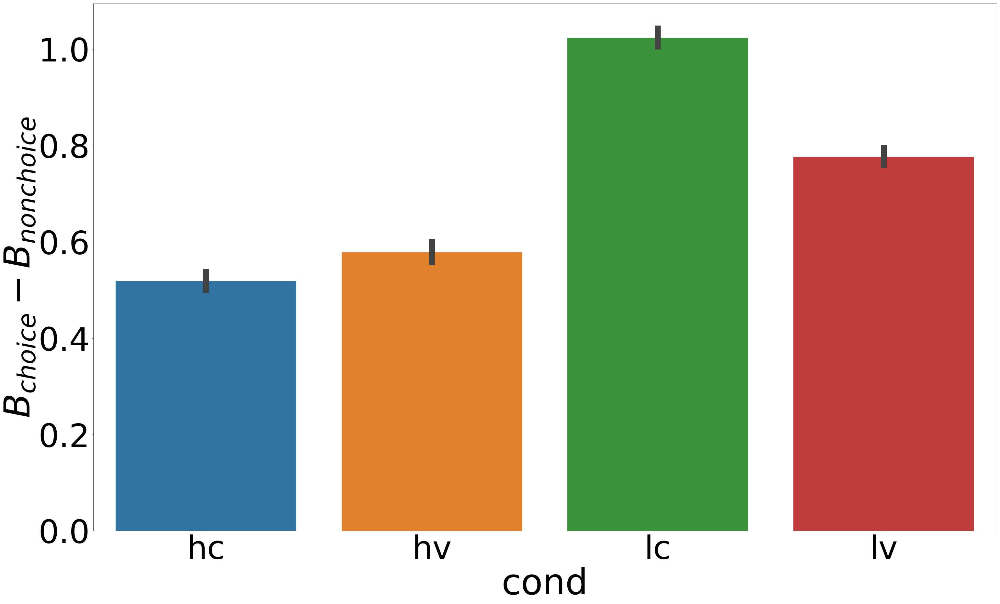

In [39]:
#b_choice
plt.figure(figsize=(50,30))
sns.barplot(x="cond",y="choice_B", data=learning_signals_sorted, ci=95, n_boot=1000)
plt.ylabel('$B_{choice} - B_{nonchoice}$')

Text(0,0.5,'$\\Omega$')

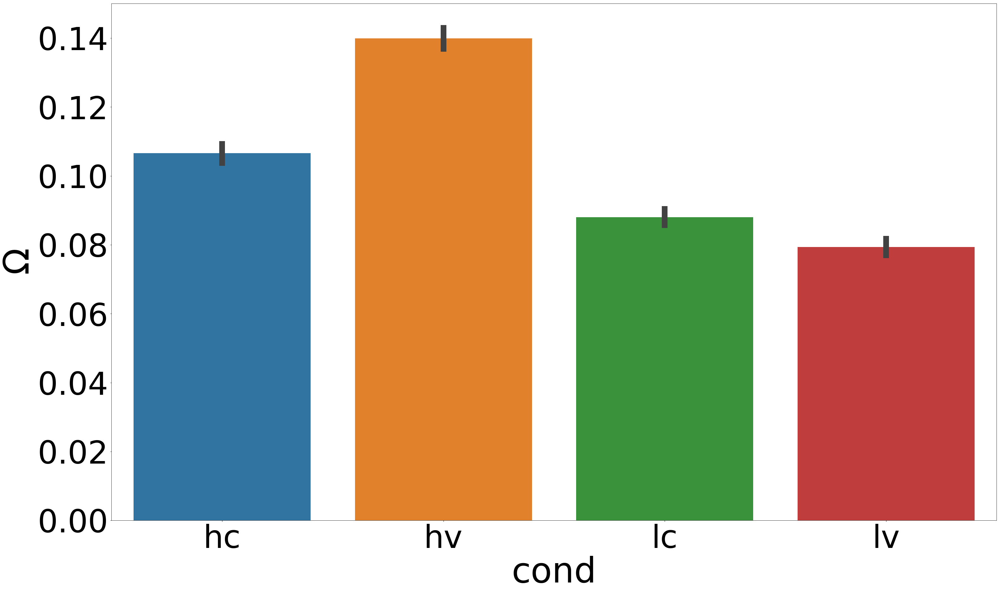

In [36]:
#cpp 
plt.figure(figsize=(50,30))
sns.barplot(x="cond",y="cpp", data=learning_signals_sorted, ci=95, n_boot=1000)
plt.ylabel('$\Omega$')

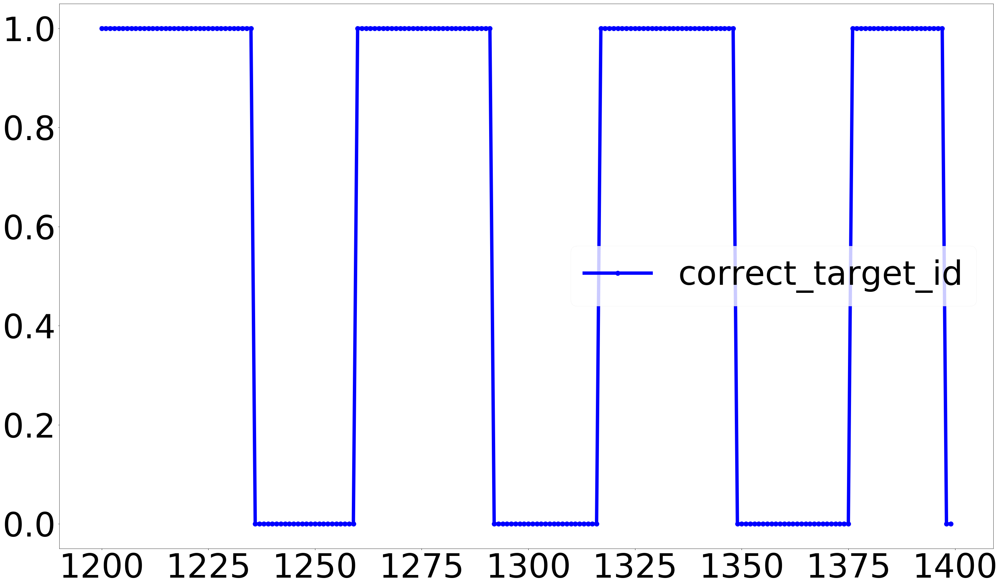

In [37]:
plt.figure(figsize=(50,30))
plt.plot(sim_sample.correct_id_choices[0:200], 'b.-', label='correct_target_id')
plt.legend()

Text(0.5,0,'Trial')

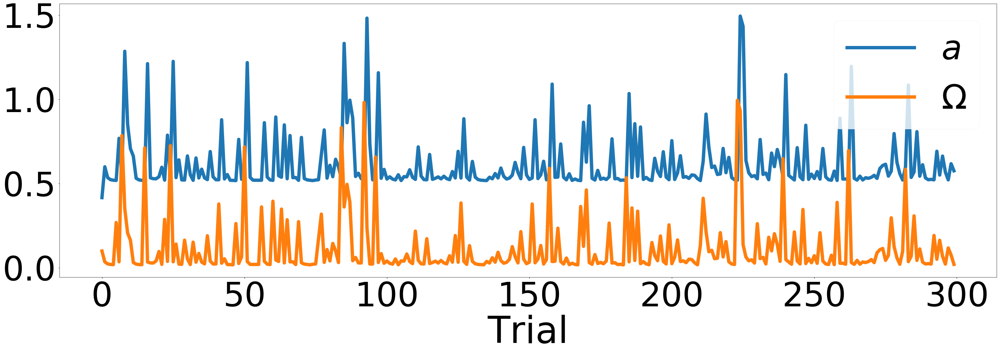

In [33]:
plt.figure(figsize=(50,15))
plt.plot(learning_signals_sorted.gen_bound[0:300], label='$a$')
plt.plot(learning_signals_sorted.cpp[0:300], label='$\Omega$')
plt.legend(loc='upper right')
plt.xlabel('Trial')

Text(0.5,0,'Trial')

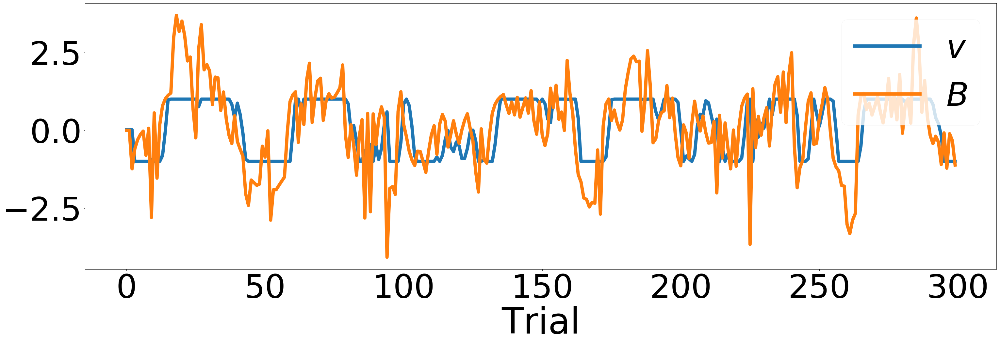

In [34]:
plt.figure(figsize=(50,15))
plt.plot(learning_signals_sorted.gen_drift[0:300], label='$v$')
plt.plot(learning_signals_sorted.target_B[0:300], label='$B$')
plt.legend(loc='upper right')
plt.xlabel('Trial')

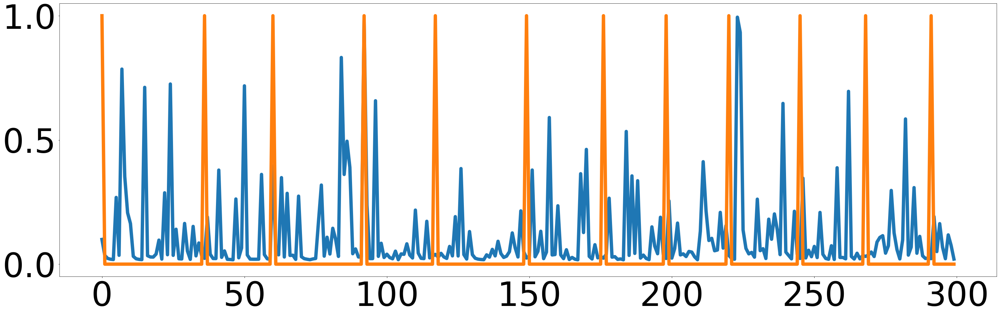

In [44]:
plt.figure(figsize=(50,15))
plt.plot(learning_signals_sorted.cpp[0:300])
plt.plot(learning_signals_sorted.cp[0:300])

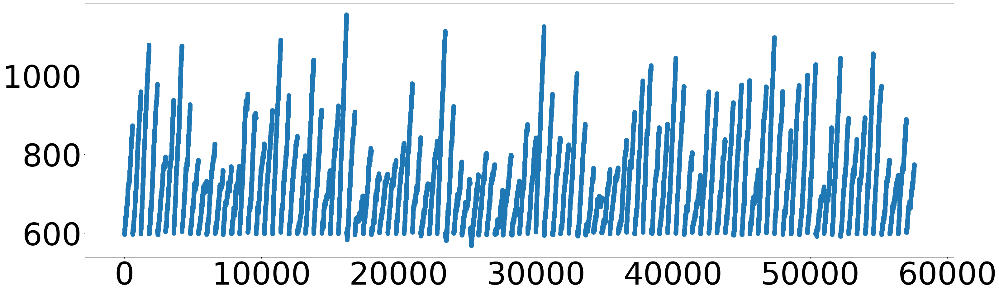

In [45]:
plt.figure(figsize=(50,15))
plt.plot(obs_df_sorted.cumulative_reward, '.')

In [35]:
obs_df_sorted.columns

Index(['LR_choice', 'obs_LR_accuracy', 'obs_LR_solution', 'reward',
       'cumulative_reward', 'rt', 'total_trial_time', 'iti',
       'cp_with_slow_fast', 'obs_cp_with_slow_fast', 'obs_high_val_cue', 'ID',
       'condition', 'coded_condition', 'original_trial', 'epoch_n',
       'epoch_trial', 'shifted_epoch_trial', 'max_epoch_n', 'repeat_trial',
       'prop_112', 'n_epoch_trials', 'p_id_solution', 'obs_low_val_cue',
       'id_choice', 'p_id_accuracy'],
      dtype='object')

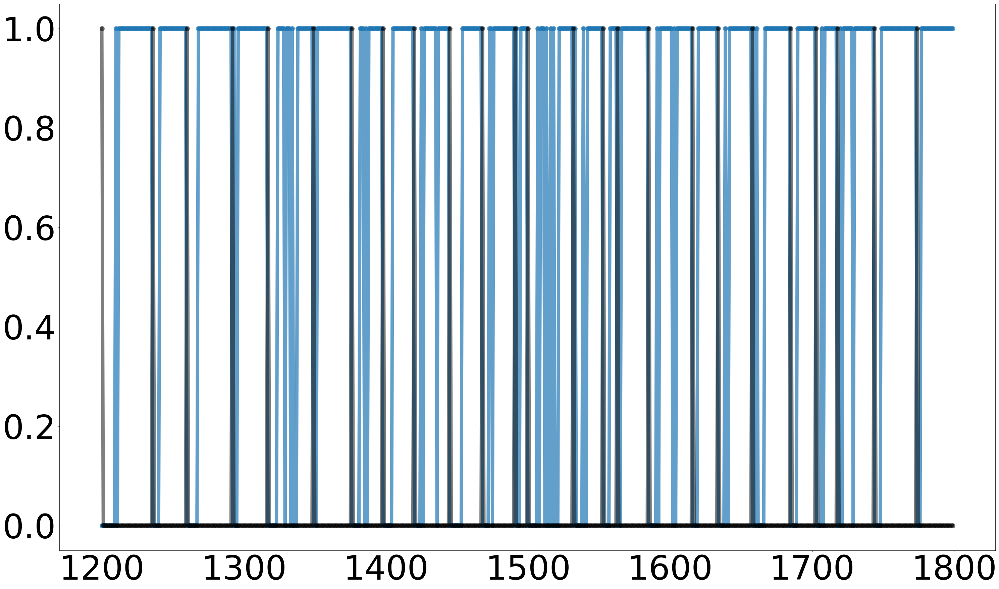

In [46]:
#sim_sample simulation accuracy
plt.figure(figsize=(50,30))
plt.plot(sim_sample.acc, '.-', alpha = 0.7)
plt.plot(sim_sample.cp, '.-', color='k', alpha=0.5)

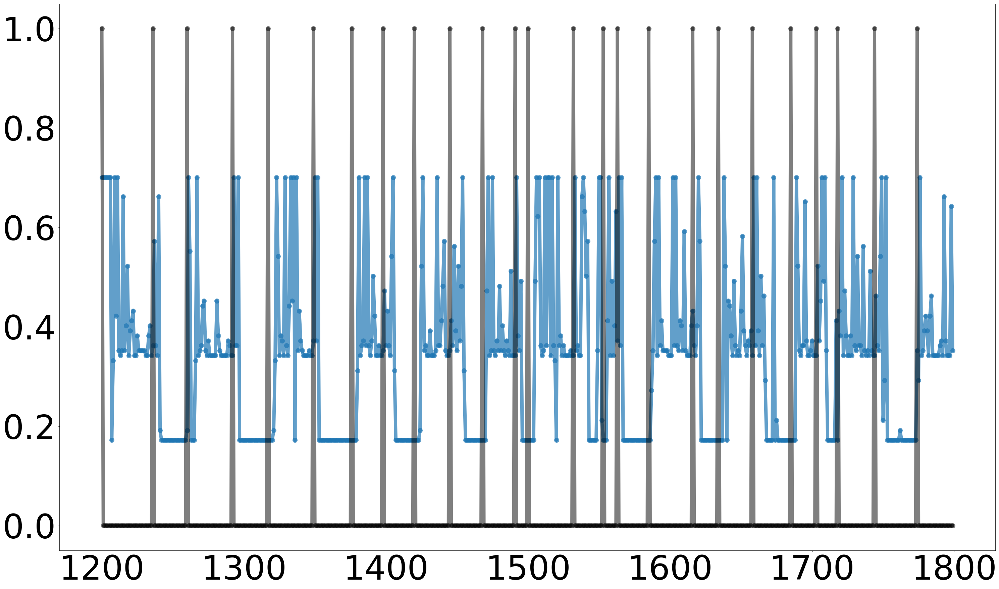

In [47]:
#sim_sample simulation rt
plt.figure(figsize=(50,30))
plt.plot(sim_sample.rt, '.-', alpha = 0.7)
plt.plot(sim_sample.cp, '.-', color='k', alpha=0.5)

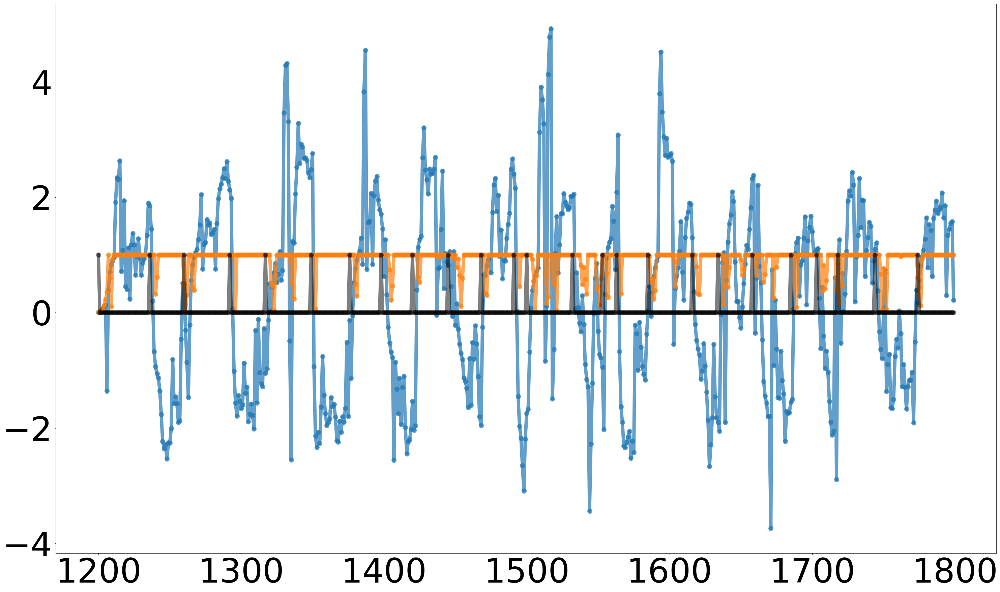

In [48]:
#sim_sample simulation belief & drift-rate
plt.figure(figsize=(50,30))
plt.plot(sim_sample.target_B, '.-', alpha = 0.7)
plt.plot(sim_sample.gen_drift, '.-', alpha = 0.7)

plt.plot(sim_sample.cp, '.-', color='k', alpha=0.5)

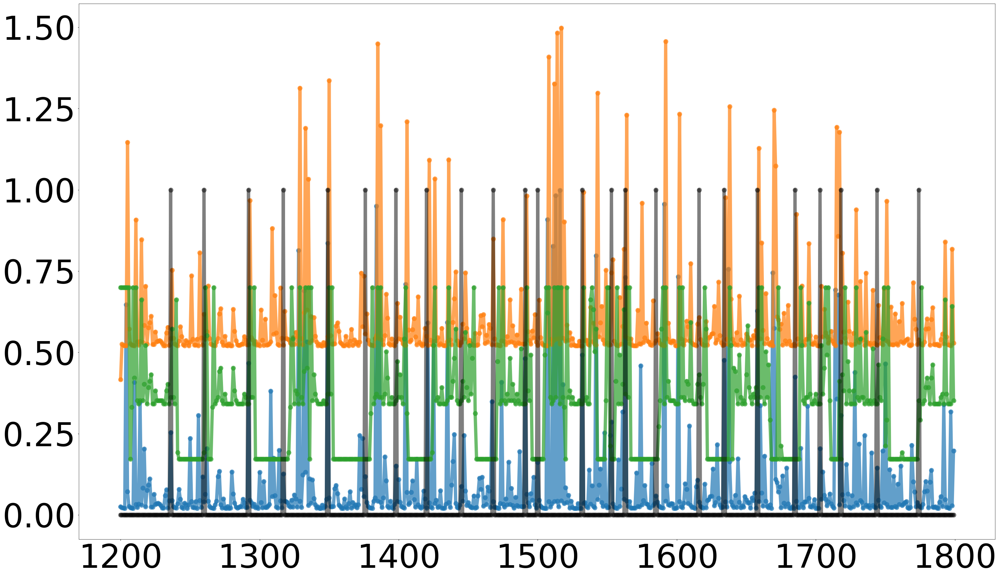

In [38]:
#sim_sample simulation cpp & bound
plt.figure(figsize=(50,30))
plt.plot(sim_sample.cpp, '.-', alpha = 0.7)
plt.plot(sim_sample.gen_bound, '.-', alpha = 0.7)
plt.plot(sim_sample.rt, '.-', alpha = 0.7)

plt.plot(sim_sample.cp, '.-', color='k', alpha=0.5)

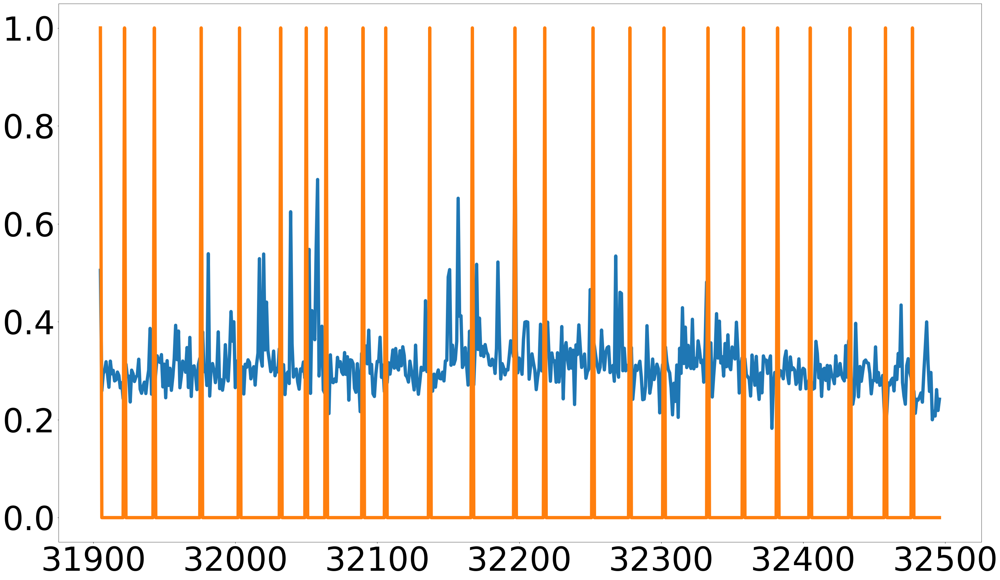

In [43]:
plt.figure(figsize=(50,30))
obs_sample = [(obs_df_sorted.ID == 761) & (obs_df_sorted.condition == 'lc')]

plt.plot(obs_sample_2.rt)
plt.plot(obs_sample_2.cp_with_slow_fast)

In [50]:
#write the sim data to csv with new variables (ideal_B ... )
# learning_signals_sorted.to_csv(write_dir+'probC_sim_learning_signals_processed.csv', index=False)

In [40]:
#drop the simulated acc & rt columns
learning_signals_sorted.drop('acc', axis=1, inplace=True)
learning_signals_sorted.drop('rt', axis=1, inplace=True)
learning_signals_sorted.drop('id_choices', axis=1, inplace=True)
learning_signals_sorted.drop('correct_id_choices', axis=1, inplace=True)
learning_signals_sorted.drop('trial', axis=1, inplace=True)

learning_signals_sorted.head()

,cpp,target_B,choice_B,cp,gen_drift,gen_bound,subj_idx,ID,cond,b_t0,b_t1,r_t1,r_t2,obs_cp,ideal_B,B_ideal_target,B_nonideal_target
0,0.099471,0.000000,0.000000,1,0.013572,0.416406,0,761,hc,0.000000,0.000000,2.528877,0.000000,0,0.000000,0.000000,0.000000
1,0.035079,0.000000,0.000000,0,0.013572,0.599471,0,761,hc,1.390214,0.149207,0.000000,3.978021,1,-1.241007,0.149207,1.390214
2,0.023075,-1.241007,1.241007,0,0.013572,0.535079,0,761,hc,0.792372,0.196591,0.000000,2.754457,0,-0.595781,0.196591,0.792372
3,0.019881,-0.595781,0.595781,0,-1.000000,0.523075,0,761,hc,0.532802,0.226667,0.000000,3.330826,0,-0.306135,0.226667,0.532802
4,0.018539,-0.306135,0.306135,0,-1.000000,0.519881,0,761,hc,0.391376,0.251982,0.000000,2.527291,0,-0.139394,0.251982,0.391376


In [41]:
#should be missing
learning_signals_sorted.rt
learning_signals_sorted.acc

AttributeError: 'DataFrame' object has no attribute 'rt'

In [42]:
learning_signals_sorted.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound',
       'subj_idx', 'ID', 'cond', 'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp',
       'ideal_B', 'B_ideal_target', 'B_nonideal_target'],
      dtype='object')

In [43]:
obs_df_sorted.head()

,LR_choice,obs_LR_accuracy,obs_LR_solution,reward,cumulative_reward,rt,total_trial_time,iti,cp_with_slow_fast,obs_cp_with_slow_fast,...,epoch_trial_zero_idx,epoch_trial_one_idx,shifted_epoch_trial_zero_idx,repeat_trial,prop_112,n_epoch_trials,p_id_solution,obs_low_val_cue,id_choice,p_id_accuracy
0,1,0,0,0,599,0.711570,2.385458,0.670199,1,0,...,0,1,0,1,0.305556,36,111,111,111,1
1,1,0,0,0,598,0.681410,1.939019,0.259707,0,1,...,1,2,1,2,0.305556,36,111,112,112,0
2,0,1,0,2,599,0.767118,2.498060,0.740615,0,0,...,2,3,2,3,0.305556,36,111,112,111,1
3,1,0,0,0,598,0.507209,1.742433,0.250242,0,0,...,3,4,3,4,0.305556,36,111,112,112,0
4,1,1,1,2,599,0.656259,2.350417,0.700190,0,0,...,4,5,4,5,0.305556,36,111,112,111,1


In [44]:
len(obs_df_sorted) == n_participants*n_clean_trials*n_cond, len(learning_signals_sorted) == n_participants*n_clean_trials*n_cond

(True, True)

In [45]:
learning_signals_sorted[['ID', 'cond']][1:5], obs_df_sorted[['ID', 'condition']][1:5]

(    ID cond
 1  761   hc
 2  761   hc
 3  761   hc
 4  761   hc,     ID condition
 1  761        hc
 2  761        hc
 3  761        hc
 4  761        hc)

In [44]:
#concatenate the dataframes by column
learning_signals_obs_data=pd.concat([learning_signals_sorted, obs_df_sorted],axis=1)
learning_signals_obs_data.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'rt',
       'acc', 'subj_idx', 'ID', 'cond', 'id_choices', 'correct_id_choices',
       'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp', 'trial', 'LR_choice',
       'obs_LR_accuracy', 'obs_LR_solution', 'reward', 'cumulative_reward',
       'rt', 'total_trial_time', 'iti', 'cp_with_slow_fast',
       'obs_cp_with_slow_fast', 'obs_high_val_cue', 'ID', 'condition',
       'coded_condition', 'original_trial', 'epoch_n', 'epoch_trial',
       'shifted_epoch_trial', 'max_epoch_n', 'repeat_trial', 'prop_112',
       'n_epoch_trials', 'p_id_solution', 'obs_low_val_cue', 'id_choice',
       'p_id_accuracy'],
      dtype='object')

In [47]:
obs_sample.p_id_solution[0:20]

1200    112
1201    112
1202    112
1203    112
1204    112
1205    112
1206    112
1207    112
1208    112
1209    112
1210    112
1211    112
1212    112
1213    112
1214    112
1215    112
1216    112
1217    112
1218    112
1219    112
Name: p_id_solution, dtype: int64

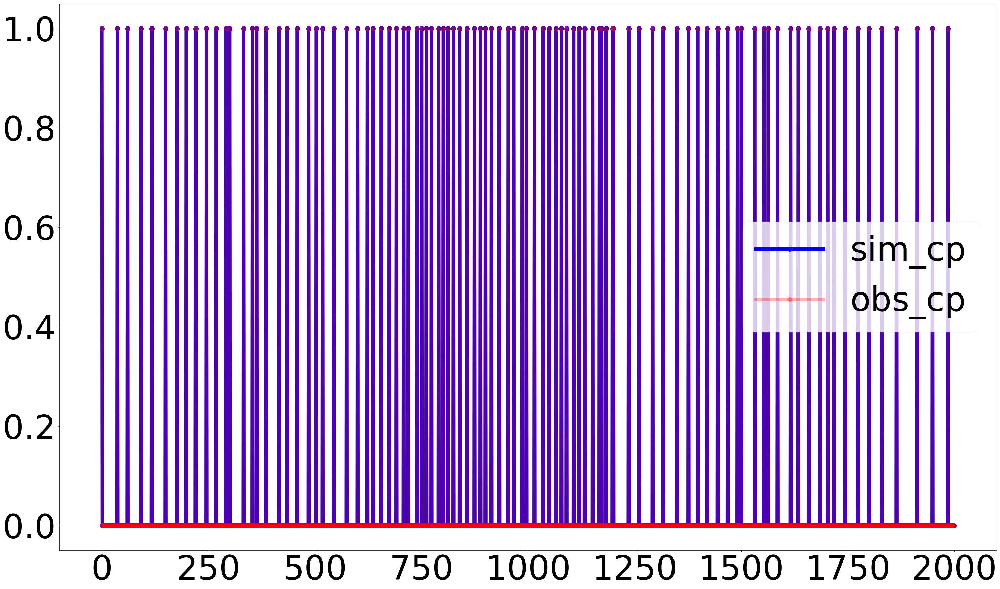

In [48]:
#cp, from simulated data, and 
#clean observed trials from cp_with_slow_fast should be the same 
plt.figure(figsize=(50,30))
plt.plot(learning_signals_obs_data.cp.values[0:2000], 'b.-', label='sim_cp')
plt.plot(learning_signals_obs_data.cp_with_slow_fast[0:2000], 'r.-', 
         label='obs_cp', alpha=0.3)
plt.legend()

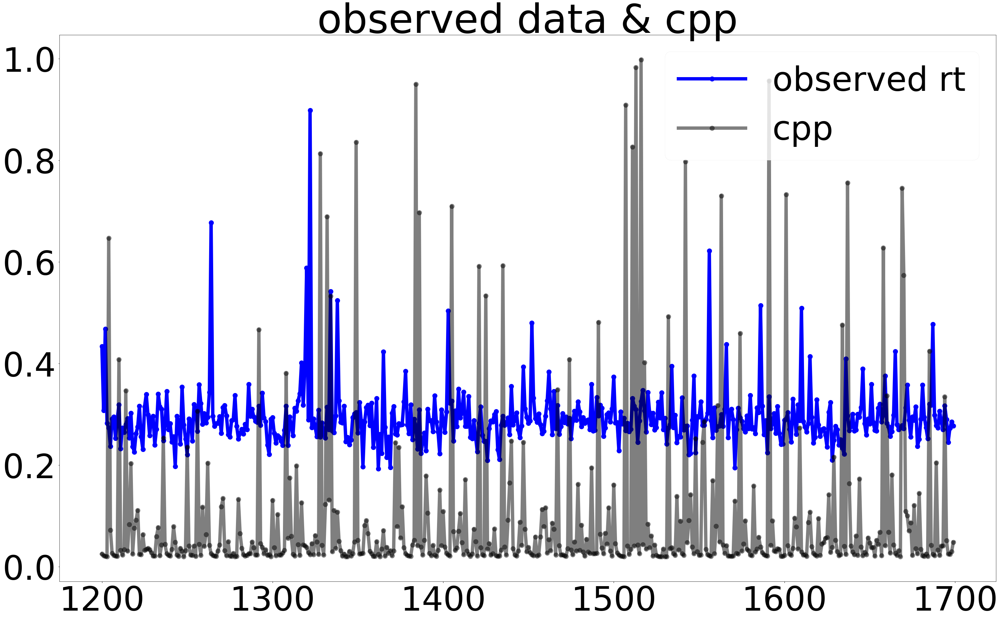

In [49]:
plt.figure(figsize=(50,30))
plt.title('observed data & cpp')
plt.plot(obs_sample.rt[0:500], 'b.-', label='observed rt')
plt.plot(sim_sample.cpp[0:500], 'k.-', label='cpp', alpha=0.5)
plt.legend()

In [63]:
learning_signals_obs_data.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'rt',
       'acc', 'subj_idx', 'ID', 'cond', 'id_choices', 'correct_id_choices',
       'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp', 'trial', 'LR_choice',
       'obs_LR_accuracy', 'obs_LR_solution', 'reward', 'cumulative_reward',
       'rt', 'total_trial_time', 'iti', 'cp_with_slow_fast',
       'obs_cp_with_slow_fast', 'obs_high_val_cue', 'ID', 'condition',
       'coded_condition', 'original_trial', 'epoch_n', 'epoch_trial',
       'shifted_epoch_trial', 'max_epoch_n', 'repeat_trial', 'prop_112',
       'n_epoch_trials', 'p_id_solution', 'obs_low_val_cue', 'id_choice',
       'p_id_accuracy'],
      dtype='object')

In [65]:
sim_sample = learning_signals_obs_data[(learning_signals_obs_data.ID == 761) & (learning_signals_obs_data.cond == 'lc')]

# plt.figure(figsize=(50,30))
# plt.plot(learning_signals_obs_data.rt[learning_signals_obs_data.condition == 'lc'][0:300], 'b.-', label='observed rt')
# # plt.plot(learning_signals_obs_data.cpp[learning_signals_obs_data.condition == 'lc'][0:300], 'k.-', label='observed rt')


TypeError: unorderable types: str() < int()

In [36]:
obs_sample.ID

NameError: name 'obs_sample' is not defined

In [50]:
learning_signals_obs_data.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound',
       'subj_idx', 'ID', 'cond', 'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp',
       'ideal_B', 'B_ideal_target', 'B_nonideal_target', 'LR_choice',
       'obs_LR_accuracy', 'obs_LR_solution', 'reward', 'cumulative_reward',
       'rt', 'total_trial_time', 'iti', 'cp_with_slow_fast',
       'obs_cp_with_slow_fast', 'obs_high_val_cue', 'ID', 'condition',
       'coded_condition', 'original_trial', 'epoch_n', 'epoch_trial',
       'shifted_epoch_trial', 'max_epoch_n', 'epoch_trial_zero_idx',
       'epoch_trial_one_idx', 'shifted_epoch_trial_zero_idx', 'repeat_trial',
       'prop_112', 'n_epoch_trials', 'p_id_solution', 'obs_low_val_cue',
       'id_choice', 'p_id_accuracy'],
      dtype='object')

In [51]:
#drop redundant labels from simulated data 
learning_signals_obs_data.drop('cond', axis=1, inplace=True)
learning_signals_obs_data.drop('subj_idx', axis=1, inplace=True)

In [52]:
#remove nan trials (hddmRegressor cannot handle nans)
learning_signals_obs_data_no_nans = learning_signals_obs_data.dropna()
#check drop
learning_signals_obs_data_no_nans.isnull().values.any()

False

In [53]:
#num. of nan-containing rows that were dropped 
len(learning_signals_obs_data)  - len(learning_signals_obs_data_no_nans) 

0

In [54]:
learning_signals_obs_data_no_nans.head(3)

,cpp,target_B,choice_B,cp,gen_drift,gen_bound,ID,b_t0,b_t1,r_t1,...,epoch_trial_zero_idx,epoch_trial_one_idx,shifted_epoch_trial_zero_idx,repeat_trial,prop_112,n_epoch_trials,p_id_solution,obs_low_val_cue,id_choice,p_id_accuracy
0,0.099471,0.000000,0.000000,1,0.013572,0.416406,761,0.000000,0.000000,2.528877,...,0,1,0,1,0.305556,36,111,111,111,1
1,0.035079,0.000000,0.000000,0,0.013572,0.599471,761,1.390214,0.149207,0.000000,...,1,2,1,2,0.305556,36,111,112,112,0
2,0.023075,-1.241007,1.241007,0,0.013572,0.535079,761,0.792372,0.196591,0.000000,...,2,3,2,3,0.305556,36,111,112,111,1


In [55]:
learning_signals_obs_data_no_nans.columns

Index(['cpp', 'target_B', 'choice_B', 'cp', 'gen_drift', 'gen_bound', 'ID',
       'b_t0', 'b_t1', 'r_t1', 'r_t2', 'obs_cp', 'ideal_B', 'B_ideal_target',
       'B_nonideal_target', 'LR_choice', 'obs_LR_accuracy', 'obs_LR_solution',
       'reward', 'cumulative_reward', 'rt', 'total_trial_time', 'iti',
       'cp_with_slow_fast', 'obs_cp_with_slow_fast', 'obs_high_val_cue', 'ID',
       'condition', 'coded_condition', 'original_trial', 'epoch_n',
       'epoch_trial', 'shifted_epoch_trial', 'max_epoch_n',
       'epoch_trial_zero_idx', 'epoch_trial_one_idx',
       'shifted_epoch_trial_zero_idx', 'repeat_trial', 'prop_112',
       'n_epoch_trials', 'p_id_solution', 'obs_low_val_cue', 'id_choice',
       'p_id_accuracy'],
      dtype='object')

In [56]:
learning_signals_obs_data_no_nans.to_csv(write_dir+'combined_learning_sig_obs_data.csv', index=False)